In [ ]:
##What percentage of loan turn from hardship to default, charge off, settlement

In [1]:
import numpy as np
import pandas as pd
from datetime import datetime as dt
from datetime import timedelta
from sklearn import preprocessing
import matplotlib as plt
%matplotlib inline

pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 2000)


In [2]:
accepted_raw=pd.read_csv('accepted_2007_to_2018Q4.csv.gz')

C:\Users\Laptop2\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3057: DtypeWarning: Columns (0,19,49,59,118,129,130,131,134,135,136,139,145,146,147) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [62]:
data=accepted_raw[['loan_status','hardship_flag','hardship_type','hardship_reason','hardship_status',"hardship_length","hardship_loan_status",'debt_settlement_flag','debt_settlement_flag_date','settlement_status','settlement_amount','settlement_percentage','settlement_term']]

In [63]:
def class_label (data):
    data['class_charge_off&Default']=[1 if ele in ['Charged Off','Default'] 
                                        else 0 
                                        for ele in data['loan_status']]
    data['class_hardship_involved']=[1 if ele==3 
                                 else 0 
                                 for ele in data['hardship_length'] ]


    data['class_hardship_flag_active']=[1 if ele=='Y' 
                                    else 0
                                    for ele in data['hardship_flag']]
    data['class_settlement_flag_active']=[1 if ele=='Y' 
                                    else 0
                                    for ele in data['debt_settlement_flag']]

    data['class_settlement_involved']=[1 if pd.notna(ele)==True 
                                 else 0 
                                 for ele in data['settlement_term'] ]
    return data


In [9]:
processed=class_label(accepted_raw)

In [10]:
processed.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term,class_charge_off&Default,class_hardship_involved,class_hardship_flag_active,class_settlement_flag_active,class_settlement_involved
0,68407277,NaN,3600.0,3600.0,3600.0,36 months,13.99,123.03,C,C4,leadman,10+ years,MORTGAGE,55000.0,Not Verified,Dec-2015,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,Debt consolidation,190xx,PA,5.91,0.0,Aug-2003,675.0,679.0,1.0,30.0,NaN,7.0,0.0,2765.0,29.7,13.0,w,0.00,0.00,4421.723917,4421.72,3600.00,821.72,0.0,0.0,0.0,Jan-2019,122.67,NaN,Mar-2019,564.0,560.0,0.0,30.0,1.0,Individual,NaN,NaN,NaN,0.0,722.0,144904.0,2.0,2.0,0.0,1.0,21.0,4981.0,36.0,3.0,3.0,722.0,34.0,9300.0,3.0,1.0,4.0,4.0,20701.0,1506.0,37.2,0.0,0.0,148.0,128.0,3.0,3.0,1.0,4.0,69.0,4.0,69.0,2.0,2.0,4.0,2.0,5.0,3.0,4.0,9.0,4.0,7.0,0.0,0.0,0.0,3.0,76.9,0.0,0.0,0.0,178050.0,7746.0,2400.0,13734.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
1,68355089,NaN,24700.0,24700.0,24700.0,36 months,11.99,820.28,C,C1,Engineer,10+ years,MORTGAGE,65000.0,Not Verified,Dec-2015,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,Business,577xx,SD,16.06,1.0,Dec-1999,715.0,719.0,4.0,6.0,NaN,22.0,0.0,21470.0,19.2,38.0,w,0.00,0.00,25679.660000,25679.66,24700.00,979.66,0.0,0.0,0.0,Jun-2016,926.35,NaN,Mar-2019,699.0,695.0,0.0,NaN,1.0,Individual,NaN,NaN,NaN,0.0,0.0,204396.0,1.0,1.0,0.0,1.0,19.0,18005.0,73.0,2.0,3.0,6472.0,29.0,111800.0,0.0,0.0,6.0,4.0,9733.0,57830.0,27.1,0.0,0.0,113.0,192.0,2.0,2.0,4.0,2.0,NaN

In [24]:
# turn issue_date to issue_year, issue_month
def transform_hardship_d(data):
    data['hardship_start_date'] = pd.to_datetime(data['hardship_start_date'])
    data['hardship_year'] = data['hardship_start_date'].dt.year
    data['hardship_month'] = data['hardship_start_date'].dt.month
    return data

In [26]:
# turn issue_date to issue_year, issue_month
def transform_debt_settlement_d(data):
    data['debt_settlement_flag_date'] = pd.to_datetime(data['debt_settlement_flag_date'])
    data['settlement_year'] = data['debt_settlement_flag_date'].dt.year
    data['settlement_month'] = data['debt_settlement_flag_date'].dt.month
    return data

In [66]:
transform_hardship_d(processed)
transform_debt_settlement_d(processed)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term,class_charge_off&Default,class_hardship_involved,class_hardship_flag_active,class_settlement_flag_active,class_settlement_involved,issue_date,issue_year,issue_month,hardship_year,hardship_month,settlement_year,settlement_month
0,68407277,NaN,3600.0,3600.0,3600.0,36 months,13.99,123.03,C,C4,leadman,10+ years,MORTGAGE,55000.00,Not Verified,Dec-2015,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,Debt consolidation,190xx,PA,5.91,0.0,Aug-2003,675.0,679.0,1.0,30.0,NaN,7.0,0.0,2765.0,29.7,13.0,w,0.00,0.00,4421.723917,4421.72,3600.00,821.72,0.000000,0.00,0.0000,Jan-2019,122.670000,NaN,Mar-2019,564.0,560.0,0.0,30.0,1.0,Individual,NaN,NaN,NaN,0.0,722.0,144904.0,2.0,2.0,0.0,1.0,21.0,4981.0,36.0,3.0,3.0,722.0,34.0,9300.0,3.0,1.0,4.0,4.0,20701.0,1506.0,37.2,0.0,0.0,148.0,128.0,3.0,3.0,1.0,4.0,69.0,4.0,69.0,2.0,2.0,4.0,2.0,5.0,3.0,4.0,9.0,4.0,7.0,0.0,0.0,0.0,3.0,76.9,0.0,0.0,0.0,178050.0,7746.0,2400.0,13734.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash,N,NaT,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,2015-12-01,2015.0,12.0,NaN,NaN,NaN,NaN
1,68355089,NaN,24700.0,24700.0,24700.0,36 months,11.99,820.28,C,C1,Engineer,10+ years,MORTGAGE,65000.00,Not Verified,Dec-2015,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,Business,577xx,SD,16.06,1.0,Dec-1999,715.0,719.0,4.0,6.0,NaN,22.0,0.0,21470.0,19.2,38.0,w,0.00,0.00,25679.660000,25679.66,24700.00,979.66,0.000000,0.00,0.0000,Jun-2016,926.350000,NaN,Mar-2019,699.0,695.0,0.0,NaN,1.0,Individual,NaN,

# Finding: 
#### hardship_start_date only has year: 2017, 2018, 2019. It means hardship related columns are added in 2017. 
#### debt_settlement_date only has year 2010,2011,2012,2013,2014,2015,2015,2016,2017,2018 and 2019.


In [70]:
processed.hardship_year.unique()

array([  nan, 2017., 2018., 2019.])

In [71]:
processed.settlement_year.unique()

array([  nan, 2017., 2018., 2019., 2016., 2015., 2014., 2013., 2012.,
       2011., 2010.])

## Finding 

#### Below visualization is for loans with hardship existed no matter if hardship flag is yes or no. 
##### We should not use hardship_flag column to indicate if the hardship existed. 

##### class_hardship_involved means that hardship columns has information no matter hardship_flag is 'N' or 'Y'
#### class_hardship_flag_active means when the hardship_flag shows 'Y'. in 2018, you can clearly see that hardship_flag_active and hardship involved values are different. 

In [51]:
##hardship_flag unique value in 2018
processed[processed.hardship_year==2017].hardship_flag.unique()

array(['N'], dtype=object)

In [52]:
##hardship_flag unique value in 2018
processed[processed.hardship_year==2018].hardship_flag.unique()

array(['N', 'Y'], dtype=object)

In [72]:
g=transform_issue_d(processed).groupby(['hardship_year','loan_status']).agg({'loan_status':'count',
                                                                        "class_hardship_involved":'sum', 
                                                                        "class_hardship_flag_active" :'sum',
                                                                        "class_settlement_involved":'sum'}).rename(columns={'loan_status':'count_loan_status'}).reset_index()

          loan_status  hardship_year  count_loan_status  \
0         Charged Off         2017.0               2652   
1             Current         2017.0               1369   
2             Default         2017.0                  1   
3          Fully Paid         2017.0               1385   
4     In Grace Period         2017.0                111   
5   Late (16-30 days)         2017.0                 50   
6  Late (31-120 days)         2017.0                211   

   class_hardship_involved  class_hardship_flag_active  \
0                     2652                           0   
1                     1369                           0   
2                        1                           0   
3                     1385                           0   
4                      111                           0   
5                       50                           0   
6                      211                           0   

   class_settlement_involved  
0                        284  


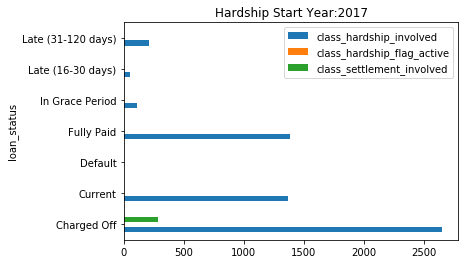

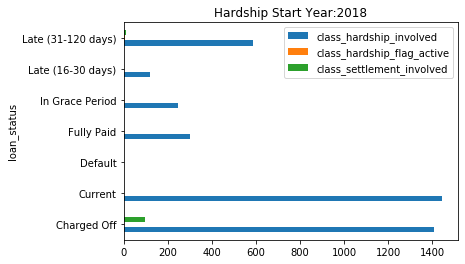

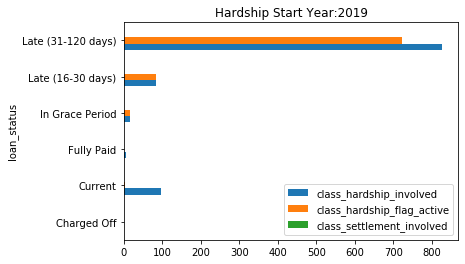

In [81]:

for year in range (2017, 2020):
    g_1=g[g['hardship_year']==year].set_index('loan_status').reset_index()
    print (g_1)
    g_1.set_index("loan_status")[['class_hardship_involved','class_hardship_flag_active','class_settlement_involved']].plot.barh(rot=0).set_title('Hardship Start Year:'+str(year))


In [79]:
g1=transform_issue_d(processed).groupby(['settlement_year','loan_status']).agg({'loan_status':'count',
                                                                        "class_hardship_involved":'sum', 
                                                                        "class_hardship_flag_active" :'sum',
                                                                        "class_set
                                                                                tlement_flag_active":'sum',
                                                                        "class_settlement_involved":'sum'}).rename(columns={'loan_status':'count_loan_status'}).reset_index()

   loan_status  settlement_year  count_loan_status  class_hardship_involved  \
0  Charged Off           2010.0                  1                        0   

   class_hardship_flag_active  class_settlement_flag_active  \
0                           0                             1   

   class_settlement_involved  
0                          1  
   loan_status  settlement_year  count_loan_status  class_hardship_involved  \
0  Charged Off           2011.0                  3                        0   

   class_hardship_flag_active  class_settlement_flag_active  \
0                           0                             3   

   class_settlement_involved  
0                          3  
                                         loan_status  settlement_year  \
0                                        Charged Off           2012.0   
1  Does not meet the credit policy. Status:Charge...           2012.0   

   count_loan_status  class_hardship_involved  class_hardship_flag_active  \
0      

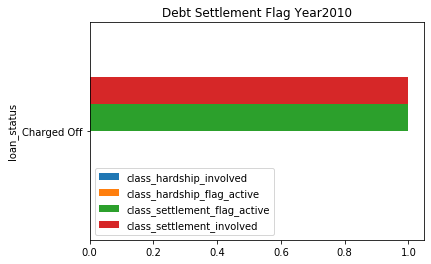

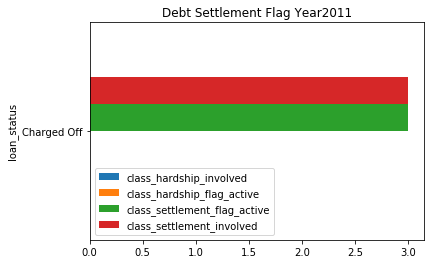

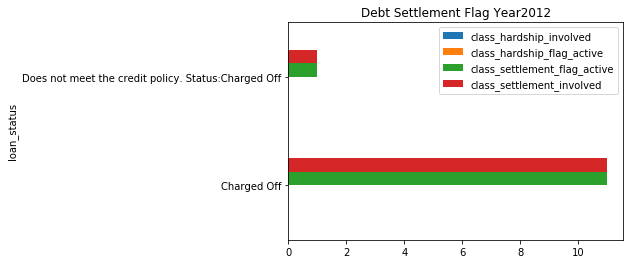

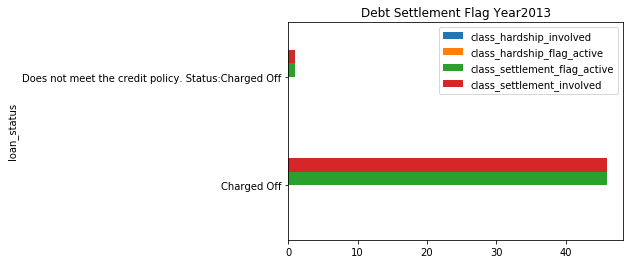

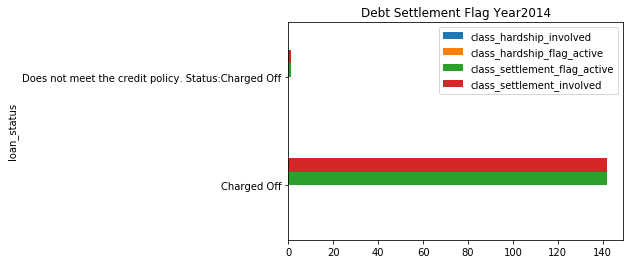

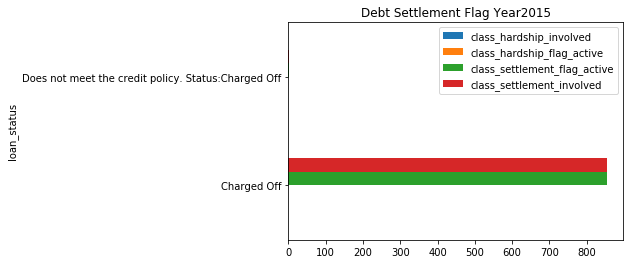

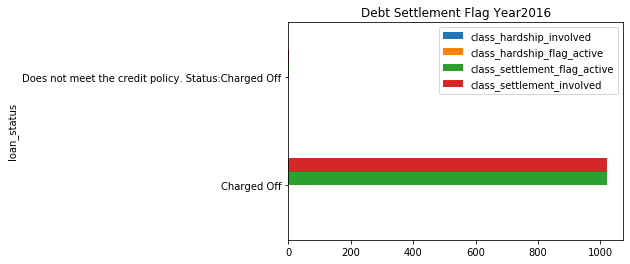

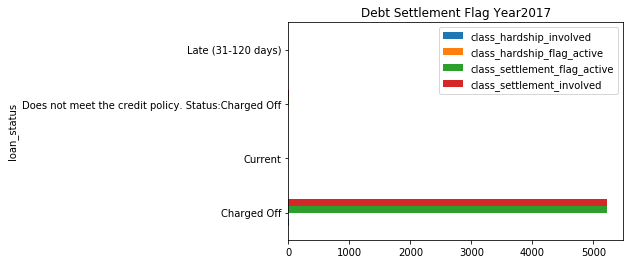

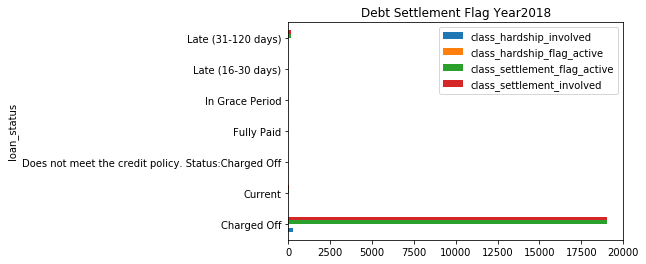

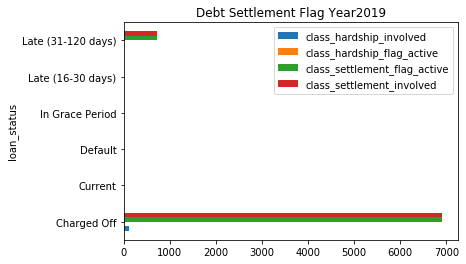

In [80]:
for year in range (2010, 2020):
    g_2=g1[g1['settlement_year']==year].set_index('loan_status').reset_index()
    print (g_2)
    g_2.set_index("loan_status")[['class_hardship_involved','class_hardship_flag_active','class_settlement_flag_active','class_settlement_involved']].plot.barh(rot=0).set_title('Debt Settlement Flag Year'+str(year))
